<a href="https://colab.research.google.com/github/AjayKumarGogineni777/Image-Super-Resolution-using-GAN/blob/master/Feature_Loss.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import fastai
from fastai.vision import *
from fastai.callbacks import *

from fastai.utils.mem import *

from torchvision.models import vgg16_bn

In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
from skimage import io
img1 = io.imread('/content/gdrive/My Drive/Satellite/GAN/classified_out/652_images/tiff2.tif')## original
img2 = io.imread('/content/gdrive/My Drive/Satellite/GAN/classified_out/652_images/tiff1.tif') ## generated

In [0]:
img1.shape

(128, 128)

In [0]:
import os
#path = '/content/gdrive/My Drive/1D U Net/train/'
#path_hr = path+'high_res/'
#path_lr = path+'with clouds/'

path = '/content/gdrive/My Drive/Satellite/GAN/432/'
path_hr = path+'without clouds_432/'
path_lr = path + 'clouds_432/'
print(len(os.listdir(path_hr)))
print(len(os.listdir(path_lr)))

7457
7460


In [0]:
### Creating an item list
il = ImageList.from_folder(path_hr)

In [0]:
## Batch size = 32
bs,size=32,128
arch = models.resnet34

src = ImageImageList.from_folder(path_lr).split_by_rand_pct(0.1, seed=42)

In [0]:
### Craeting a databuch object using fastai functionalities

def get_data(bs,size):
    data = (src.label_from_func(lambda x: path_hr+x.name)
           .transform(get_transforms(max_zoom=2.), size=size, tfm_y=True)
           .databunch(bs=bs).normalize(imagenet_stats, do_y=True))

    data.c = 3
    return data

In [0]:
data

ImageDataBunch;

Train: LabelList (6516 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /content/gdrive/My Drive/1D U Net/train/with clouds;

Valid: LabelList (723 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /content/gdrive/My Drive/1D U Net/train/with clouds;

Test: None

In [0]:
data = get_data(bs,size)

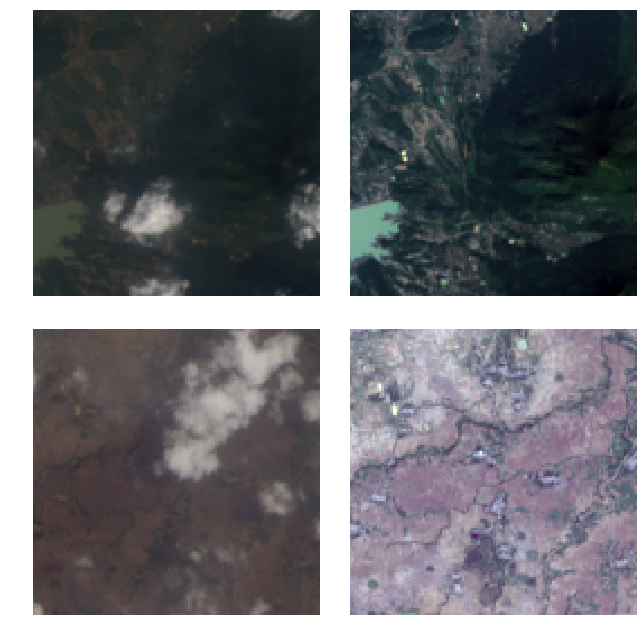

In [0]:
data.show_batch(ds_type=DatasetType.Valid, rows=2, figsize=(9,9))

Feature Loss


In [0]:
#### Feature Loss

In [0]:
t = data.valid_ds[0][1].data
t = torch.stack([t,t])

In [0]:
def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)
#gram_matrix(t)  

In [0]:
base_loss = F.l1_loss

In [0]:
vgg_m = vgg16_bn(True).features.cuda().eval()
requires_grad(vgg_m, False)

Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /root/.cache/torch/checkpoints/vgg16_bn-6c64b313.pth
100%|██████████| 553507836/553507836 [00:05<00:00, 106982385.25it/s]


In [0]:
blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)]
blocks, [vgg_m[i] for i in blocks]

([5, 12, 22, 32, 42],
 [ReLU(inplace), ReLU(inplace), ReLU(inplace), ReLU(inplace), ReLU(inplace)])

In [0]:
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        self.feat_losses = [base_loss(input,target)]
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)
    
    def __del__(self): self.hooks.remove()

In [0]:
feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])

In [0]:
wd = 1e-3
learn = unet_learner(data, arch, wd=wd, loss_func=feat_loss, callback_fns=LossMetrics,
                     blur=True, norm_type=NormType.Weight)
gc.collect();


Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 87306240/87306240 [00:00<00:00, 116849459.28it/s]


In [0]:
learn.lr_find()
learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


FileNotFoundError: ignored

In [0]:
lr = 1e-3

In [0]:
def do_fit(save_name, lrs=slice(lr), pct_start=0.9):
    learn.fit_one_cycle(10, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=1, imgsize=5)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.932801,1.951289,0.394698,0.251622,0.235975,0.052206,0.424355,0.555241,0.037191,28:58
1,1.790782,1.943772,0.408139,0.239222,0.231087,0.051092,0.428865,0.548487,0.036880,01:48
2,1.729057,1.764987,0.315582,0.237659,0.227546,0.050164,0.379471,0.518568,0.035998,01:52
3,1.711740,1.717193,0.311691,0.232146,0.222150,0.049135,0.365070,0.501980,0.035022,01:53
4,1.663164,1.741608,0.333854,0.232745,0.222765,0.049375,0.364604,0.502867,0.035398,01:53
5,1.655028,1.709612,0.311423,0.232175,0.221563,0.050408,0.357449,0.500315,0.036280,01:53
6,1.641182,1.646590,0.286656,0.227952,0.218116,0.047465,0.345537,0.487015,0.033849,01:53
7,1.632672,1.661205,0.297526,0.228614,0.218020,0.048200,0.347467,0.487055,0.034323,01:53
8,1.613076,1.653756,0.310509,0.227525,0.216200,0.047267,0.337929,0.480809,0.033517,01:53
9,1.545485,1.544420,0.253832,0.223444,0.210659,0.046398,0.316693,0.460350,0.033044,01:53


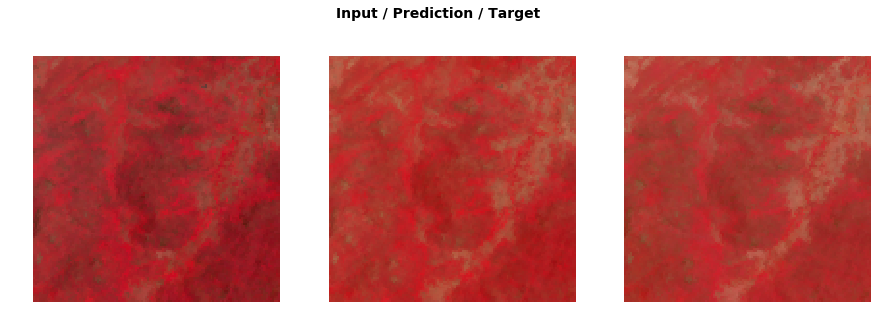

In [0]:
do_fit('1a_432', slice(lr*10))

In [0]:
learn.unfreeze()

In [0]:
def do_fit_multi_imgs(save_name, lrs=slice(lr), pct_start=0.9):
    learn.fit_one_cycle(10, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=40, imgsize=5)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.526162,1.541851,0.253872,0.223450,0.210654,0.046486,0.314558,0.459710,0.033121,01:51
1,1.523782,1.546532,0.260090,0.222975,0.210477,0.046447,0.314340,0.459131,0.033072,01:56
2,1.533963,1.533698,0.252178,0.222938,0.209961,0.046297,0.311703,0.457674,0.032947,01:57
3,1.525309,1.532163,0.252568,0.222711,0.209827,0.046308,0.310724,0.457071,0.032954,01:58
4,1.519717,1.527614,0.248170,0.222522,0.209915,0.046364,0.310429,0.457180,0.033035,01:58
5,1.514313,1.521556,0.248590,0.222195,0.208970,0.046246,0.308383,0.454190,0.032982,01:58
6,1.523874,1.518636,0.248502,0.221628,0.208867,0.045957,0.307706,0.453244,0.032732,01:58
7,1.518800,1.516937,0.248667,0.221413,0.208421,0.046111,0.306478,0.452935,0.032911,01:58
8,1.516007,1.521834,0.252043,0.221449,0.208463,0.046080,0.307666,0.453272,0.032861,01:58
9,1.489508,1.498600,0.237875,0.220826,0.207813,0.045798,0.303427,0.450250,0.032611,01:59


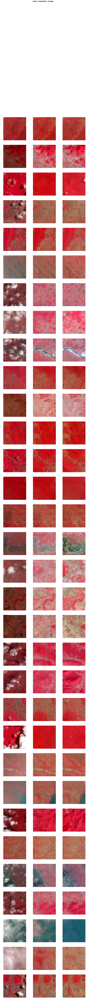

In [0]:
do_fit_multi_imgs('1b_432', slice(1e-5,lr))

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.484852,1.500316,0.240056,0.221006,0.207813,0.045793,0.303122,0.449902,0.032624,01:51
1,1.486761,1.499507,0.240633,0.220806,0.207814,0.045733,0.302709,0.449254,0.032558,01:55
2,1.478740,1.495792,0.238993,0.220822,0.207703,0.045801,0.301429,0.448398,0.032646,01:57
3,1.481004,1.503940,0.244967,0.220933,0.207455,0.045947,0.302514,0.449329,0.032794,01:58
4,1.495491,1.491483,0.235605,0.220560,0.207530,0.045709,0.301330,0.448183,0.032566,01:58
5,1.490322,1.510564,0.246104,0.221416,0.208442,0.046037,0.304195,0.451519,0.032850,01:58
6,1.486223,1.524493,0.254246,0.221533,0.208547,0.046089,0.307090,0.454158,0.032830,01:58
7,1.488675,1.495044,0.240800,0.220563,0.207509,0.045963,0.299710,0.447681,0.032818,01:58
8,1.479625,1.500063,0.242387,0.220437,0.207654,0.045839,0.302126,0.448840,0.032780,01:58
9,1.465985,1.482956,0.234768,0.219720,0.206778,0.045564,0.297970,0.445700,0.032458,01:58


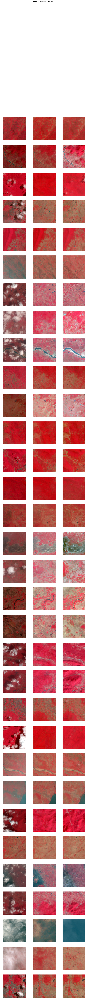

In [0]:
do_fit_multi_imgs('1c_432', slice(3e-5,lr))

In [0]:

data_lr = (ImageImageList.from_folder(path_lr).split_by_rand_pct(0.1, seed=42)
          .label_from_func(lambda x: path_hr+ x.name)
          .transform(get_transforms(), size=size, tfm_y=True)
          .databunch(bs=1).normalize(imagenet_stats, do_y=True))
data_lr.c = 3

In [0]:
fn = data_lr.valid_ds.x.items[0]; fn

PosixPath('/content/gdrive/My Drive/1D U Net/train/with clouds/502.tiff')

In [0]:
img = open_image(fn); img.shape

torch.Size([3, 128, 128])

In [0]:
p,img_hr,b = learn.predict(img)

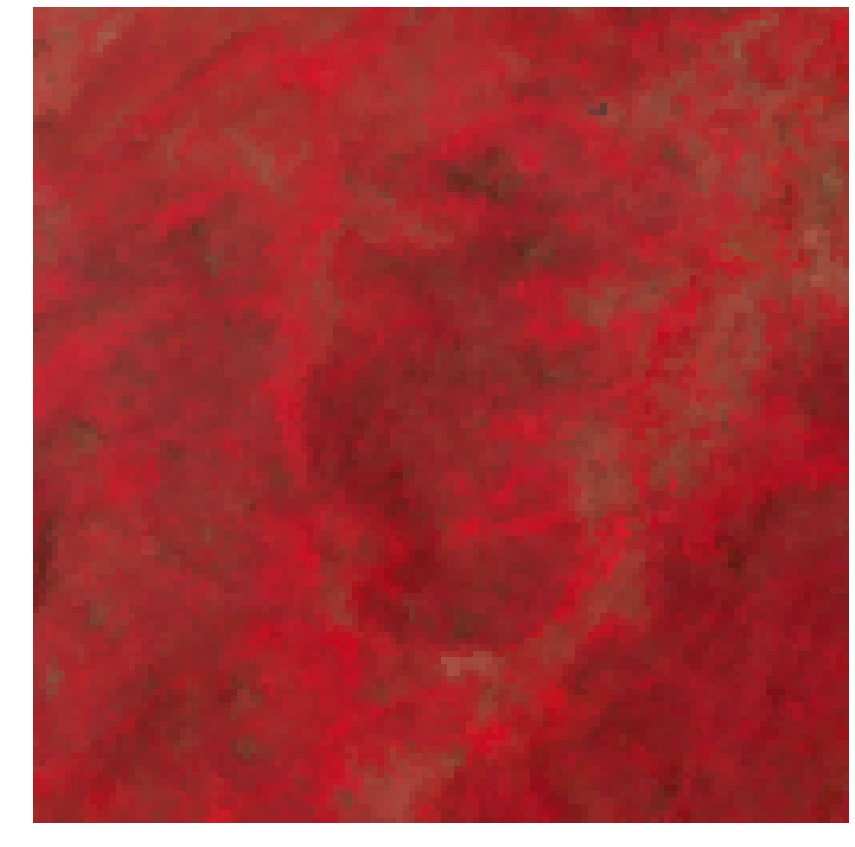

In [0]:
show_image(img, figsize=(18,15), interpolation='nearest');

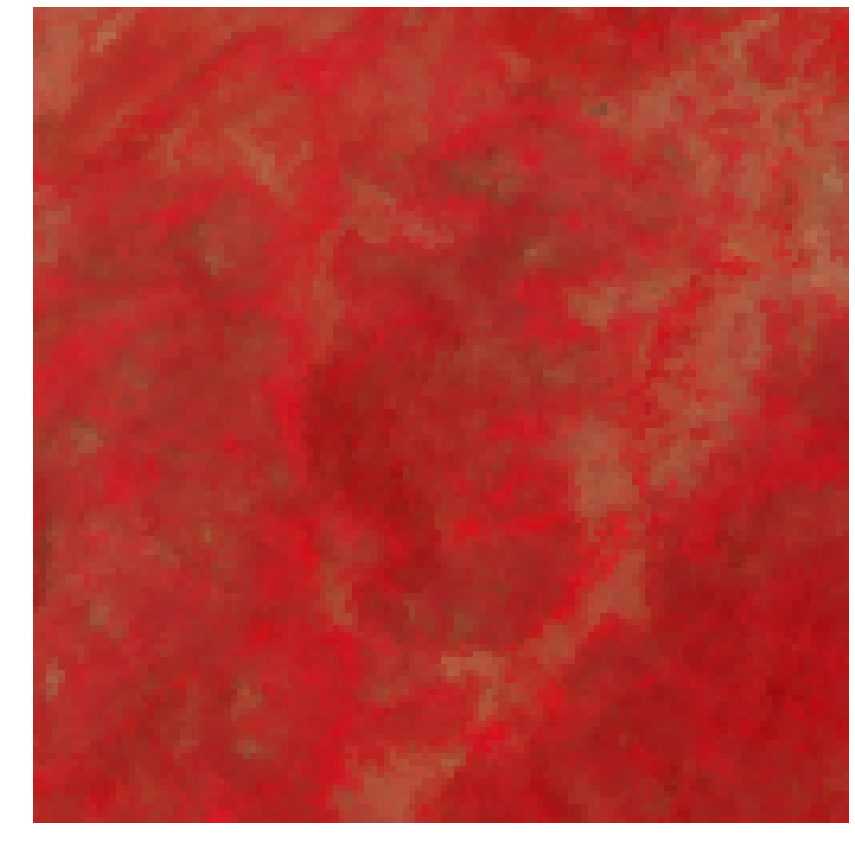

In [0]:
Image(img_hr).show(figsize=(18,15))

In [0]:
fn = data_lr.valid_ds.x.items[0:723]; fn

array([PosixPath('/content/gdrive/My Drive/1D U Net/train/with clouds/502.tiff'),
       PosixPath('/content/gdrive/My Drive/1D U Net/train/with clouds/10023.tiff'),
       PosixPath('/content/gdrive/My Drive/1D U Net/train/with clouds/21673.tiff'),
       PosixPath('/content/gdrive/My Drive/1D U Net/train/with clouds/21441.tiff'), ...,
       PosixPath('/content/gdrive/My Drive/1D U Net/train/with clouds/1400.tiff'),
       PosixPath('/content/gdrive/My Drive/1D U Net/train/with clouds/983.tiff'),
       PosixPath('/content/gdrive/My Drive/1D U Net/train/with clouds/4081.tiff'),
       PosixPath('/content/gdrive/My Drive/1D U Net/train/with clouds/21477.tiff')], dtype=object)

In [0]:
with open(path+'valid_ids.txt', 'w') as f:
    for s in fn:
        f.write(str(s) + '\n')

In [0]:
img = open_image(fn); img.shape
p,img_hr,b = learn.predict(img)

In [0]:
data.valid_ds.x

ImageImageList (723 items)
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /content/gdrive/My Drive/1D U Net/train/with clouds

In [0]:
cnt = 0
from skimage import io
for i in range(723):
  
  fn = data.valid_ds.x.items[i]
  
  imarray = io.imread(fn)
  
  #p,img_hr,b = learn.predict(img)
  
  io.imsave('/content/gdrive/My Drive/1D U Net/train/valid_inputs/%d.tiff'%(cnt),imarray)
  
  #io.imsave('/content/gdrive/My Drive/1D U Net/train/valid_preds/%d.tiff'%(cnt),img_hr.numpy())
  
  cnt = cnt+1

In [0]:
imarray = np.array(img) 
imarray

array(Image (3, 128, 128), dtype=object)

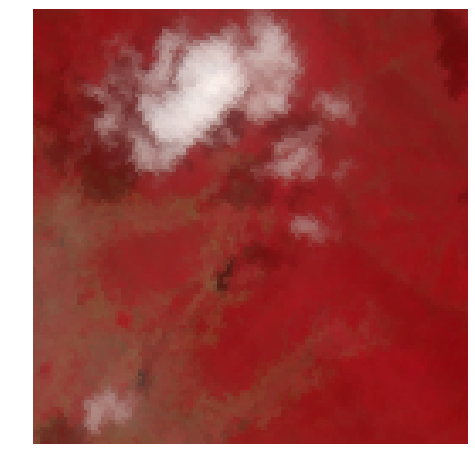

In [0]:
show_image(img, figsize=(8,8), interpolation='nearest');

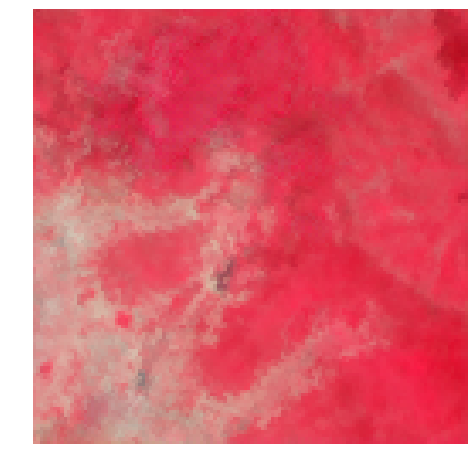

In [0]:
Image(img_hr).show(figsize=(8,8))

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.466070,1.496577,0.237966,0.220225,0.207303,0.045794,0.302061,0.450541,0.032686,01:54


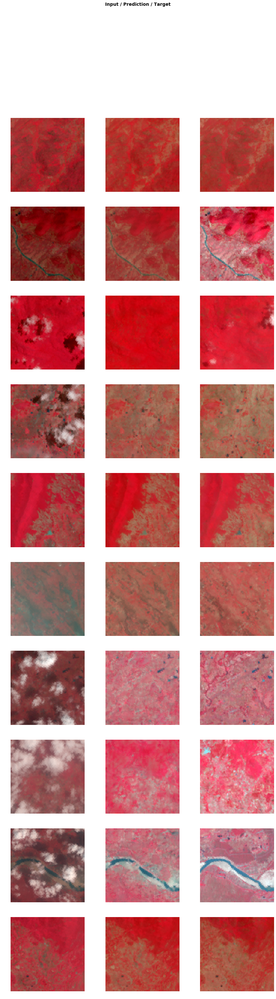

In [0]:
def do_fit_multi_imgs(save_name, lrs=slice(lr), pct_start=0.9):
    learn.fit_one_cycle(1, lrs, pct_start=pct_start)
    #learn.save(save_name)
    learn.show_results(rows=10, imgsize=5)
do_fit_multi_imgs('1c', slice(3e-5,lr))